# Анализ представленных данных (EDA)

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
pd.set_option('display.max_columns', 100)

from scipy import stats
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import warnings
warnings.filterwarnings('ignore')

In [ ]:
df = pd.read_excel('Данные_для_курсовои_Классическое_МО.xlsx', index_col=0)
df.head()

,"IC50, mM","CC50, mM",SI,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,NumRadicalElectrons,MaxPartialCharge,MinPartialCharge,MaxAbsPartialCharge,MinAbsPartialCharge,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,BCUT2D_MWHI,BCUT2D_MWLOW,BCUT2D_CHGHI,BCUT2D_CHGLO,BCUT2D_LOGPHI,BCUT2D_LOGPLOW,BCUT2D_MRHI,BCUT2D_MRLOW,AvgIpc,BalabanJ,BertzCT,Chi0,Chi0n,Chi0v,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3n,Chi3v,Chi4n,Chi4v,HallKierAlpha,Ipc,Kappa1,Kappa2,Kappa3,LabuteASA,...,fr_benzodiazepine,fr_bicyclic,fr_diazo,fr_dihydropyridine,fr_epoxide,fr_ester,fr_ether,fr_furan,fr_guanido,fr_halogen,fr_hdrzine,fr_hdrzone,fr_imidazole,fr_imide,fr_isocyan,fr_isothiocyan,fr_ketone,fr_ketone_Topliss,fr_lactam,fr_lactone,fr_methoxy,fr_morpholine,fr_nitrile,fr_nitro,fr_nitro_arom,fr_nitro_arom_nonortho,fr_nitroso,fr_oxazole,fr_oxime,fr_para_hydroxylation,fr_phenol,fr_phenol_noOrthoHbond,fr_phos_acid,fr_phos_ester,fr_piperdine,fr_piperzine,fr_priamide,fr_prisulfonamd,fr_pyridine,fr_quatN,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,6.239374,175.482382,28.125000,5.094096,5.094096,0.387225,0.387225,0.417362,42.928571,384.652,340.300,384.350449,158,0,0.038844,-0.293526,0.293526,0.038844,0.642857,1.035714,1.321429,14.822266,9.700470,2.600532,-2.343082,2.644698,-2.322229,5.944519,0.193481,3.150503,1.164038,611.920301,20.208896,19.534409,19.534409,13.127794,12.204226,12.204226,12.058078,12.058078,10.695991,10.695991,7.340247,7.340247,-0.66,2.187750e+06,20.606247,6.947534,2.868737,173.630124,...,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0
1,0.771831,5.402819,7.000000,3.961417,3.961417,0.533868,0.533868,0.462473,45.214286,388.684,340.300,388.381750,162,0,0.012887,-0.313407,0.313407,0.012887,0.607143,1.000000,1.285714,14.975110,9.689226,2.614066,-2.394690,2.658342,-2.444817,5.134527,0.120322,3.150503,1.080362,516.780124,20.208896,19.794682,19.794682,13.127794,12.595754,12.595754,12.648545,12.648545,11.473090,11.473090,8.180905,8.180905,-0.08,2.187750e+06,21.163454,7.257648,3.027177,174.939204,...,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0
2,223.808778,161.142320,0.720000,2.627117,2.627117,0.543231,0.543231,0.260923,42.187500,446.808,388.344,446.458903,186,0,0.094802,-0.325573,0.325573,0.094802,0.562500,0.906250,1.156250,15.353938,9.681293,2.665274,-2.477203,2.679014,-2.565224,5.117187,-0.922902,3.214947,1.219066,643.620154,23.794682,23.689110,23.689110,14.595754,14.249005,14.249005,15.671216,15.671216,13.402236,13.402236,10.140303,10.140303,-0.08,8.610751e+06,25.026112,7.709373,3.470070,201.238858,...,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,3,0
3,1.705624,107.855654,63.235294,5.097360,5.097360,0.390603,0.390603,0.377846,41.862069,398.679,352.311,398.366099,164,0,0.038844,-0.293526,0.293526,0.038844,0.620690,1.000000,1.310345,14.821216,9.700497,2.600529,-2.342885,2.644709,-2.322030,5.944502,0.193510,3.179270,1.120513,626.651366,20.916003,20.241516,20.241516,13.627794,12.704226,12.704226,12.411631,12.411631,10.945991,10.945991,7.517023,7.517023,-0.66,3.572142e+06,21.567454,7.485204,3.263848,179.995066,...,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0
4,107.131532,139.270991,1.300000,5.150510,5.150510,0.270476,0.270476,0.429038,36.514286,466.713,424.377,466.334799,184,0,0.062897,-0.257239,0.257239,0.062897,0.600000,0.971429,1.257143,14.831112,9.700386,2.602486,-2.342009,2.648473,-2.318893,5.963448,0.193687,3.337074,1.136678,1101.164252,24.639617,22.617677,22.617677,16.526773,13.868825,13.868825,13.613700,13.613700,11.833480,11.833480,8.119076,8.119076,-2.22,1.053758e+08,23.194917,7.639211,3.345855,211.919602,...,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1001 entries, 0 to 1000
Columns: 213 entries, IC50, mM to fr_urea
dtypes: float64(107), int64(106)
memory usage: 1.6 MB


In [ ]:
print("Размер данных:", df.shape)

Размер данных: (1001, 213)


In [ ]:
for idx, column in enumerate(df.columns, 1):
    print(f"{idx}. {column}")

1. IC50, mM
2. CC50, mM
3. SI
4. MaxAbsEStateIndex
5. MaxEStateIndex
6. MinAbsEStateIndex
7. MinEStateIndex
8. qed
9. SPS
10. MolWt
11. HeavyAtomMolWt
12. ExactMolWt
13. NumValenceElectrons
14. NumRadicalElectrons
15. MaxPartialCharge
16. MinPartialCharge
17. MaxAbsPartialCharge
18. MinAbsPartialCharge
19. FpDensityMorgan1
20. FpDensityMorgan2
21. FpDensityMorgan3
22. BCUT2D_MWHI
23. BCUT2D_MWLOW
24. BCUT2D_CHGHI
25. BCUT2D_CHGLO
26. BCUT2D_LOGPHI
27. BCUT2D_LOGPLOW
28. BCUT2D_MRHI
29. BCUT2D_MRLOW
30. AvgIpc
31. BalabanJ
32. BertzCT
33. Chi0
34. Chi0n
35. Chi0v
36. Chi1
37. Chi1n
38. Chi1v
39. Chi2n
40. Chi2v
41. Chi3n
42. Chi3v
43. Chi4n
44. Chi4v
45. HallKierAlpha
46. Ipc
47. Kappa1
48. Kappa2
49. Kappa3
50. LabuteASA
51. PEOE_VSA1
52. PEOE_VSA10
53. PEOE_VSA11
54. PEOE_VSA12
55. PEOE_VSA13
56. PEOE_VSA14
57. PEOE_VSA2
58. PEOE_VSA3
59. PEOE_VSA4
60. PEOE_VSA5
61. PEOE_VSA6
62. PEOE_VSA7
63. PEOE_VSA8
64. PEOE_VSA9
65. SMR_VSA1
66. SMR_VSA10
67. SMR_VSA2
68. SMR_VSA3
69. SMR_VSA4
70

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
"IC50, mM",1001.0,222.805156,402.169734,0.003517,12.515396,46.585183,224.975928,4128.529377
"CC50, mM",1001.0,589.110728,642.867508,0.700808,99.999036,411.039342,894.089176,4538.976189
SI,1001.0,72.508823,684.482739,0.011489,1.433333,3.846154,16.566667,15620.600000
MaxAbsEStateIndex,1001.0,10.831637,3.307505,2.321942,9.252350,12.179236,13.167843,15.933463
MaxEStateIndex,1001.0,10.831637,3.307505,2.321942,9.252350,12.179236,13.167843,15.933463
...,...,...,...,...,...,...,...,...
fr_thiazole,1001.0,0.051948,0.222033,0.000000,0.000000,0.000000,0.000000,1.000000
fr_thiocyan,1001.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
fr_thiophene,1001.0,0.069930,0.255157,0.000000,0.000000,0.000000,0.000000,1.000000
fr_unbrch_alkane,1001.0,0.204795,1.215326,0.000000,0.000000,0.000000,0.000000,20.000000


Посмотрим на распределение IC50, CC50 и SI - целевых переменных

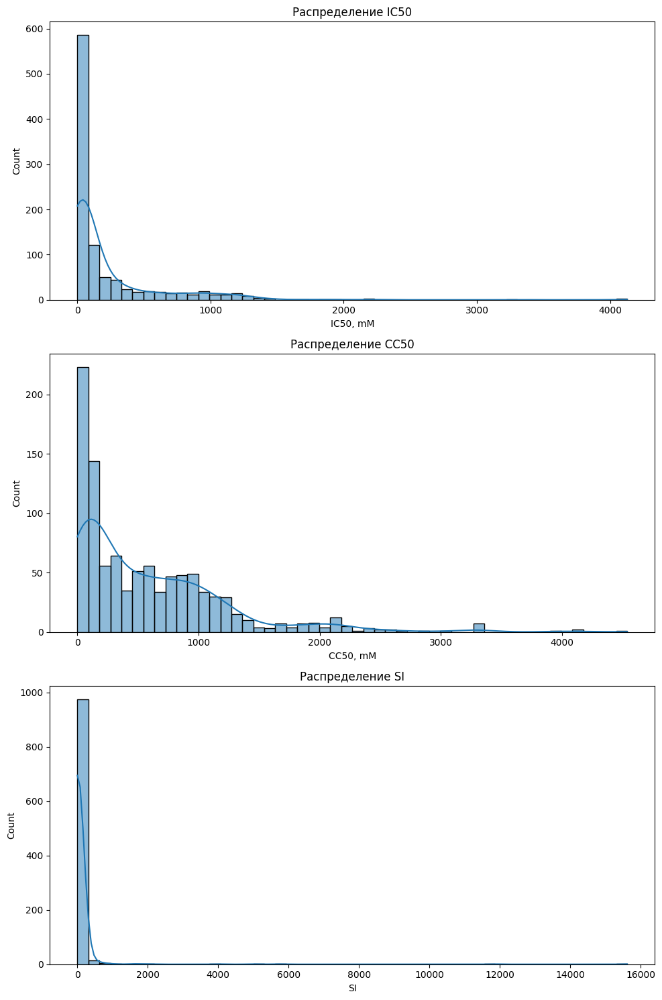

In [ ]:
plt.figure(figsize=(10, 15))

plt.subplot(3, 1, 1)
sns.histplot(df['IC50, mM'], kde=True, bins=50)
plt.title('Распределение IC50')

plt.subplot(3, 1, 2)
sns.histplot(df['CC50, mM'], kde=True, bins=50)
plt.title('Распределение CC50')

plt.subplot(3, 1, 3)
sns.histplot(df['SI'], kde=True, bins=50)
plt.title('Распределение SI')

plt.tight_layout()
plt.show()

Распределение для всех перменных не нормальное, а с правосторонним распределением (ассиметрия). Попробуем использовать логарифм для преобразования


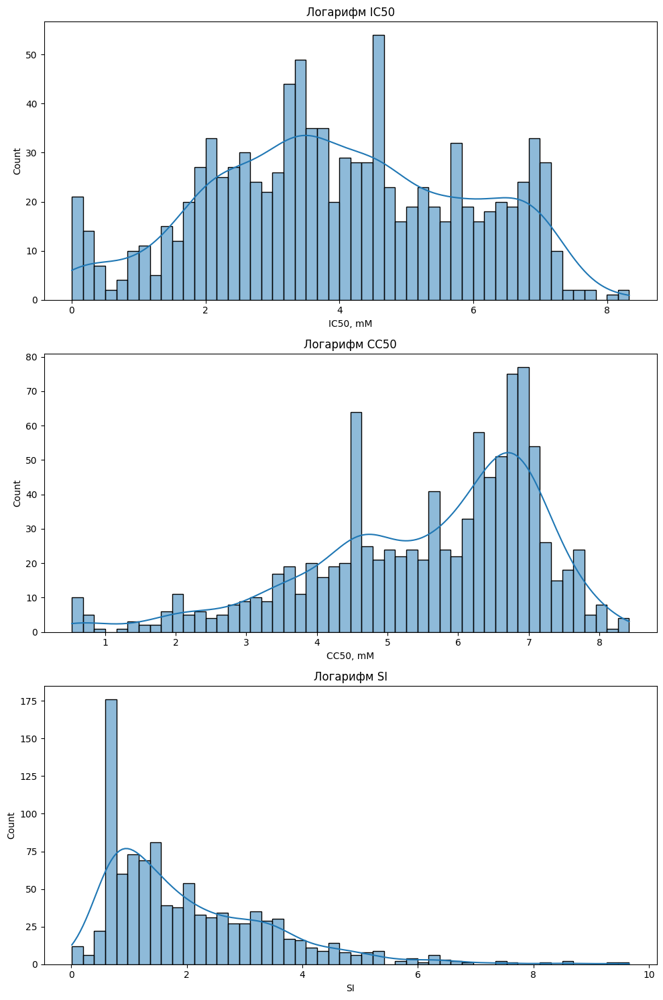

In [ ]:
plt.figure(figsize=(10, 15))

plt.subplot(3, 1, 1)
sns.histplot(np.log1p(df['IC50, mM']), kde=True, bins=50)
plt.title('Логарифм IC50')

plt.subplot(3, 1, 2)
sns.histplot(np.log1p(df['CC50, mM']), kde=True, bins=50)
plt.title('Логарифм CC50')

plt.subplot(3, 1, 3)
sns.histplot(np.log1p(df['SI']), kde=True, bins=50)
plt.title('Логарифм SI')

plt.tight_layout()
plt.show()

Появилось приближение к нормальному распределению,однако заметна бимодальность

Посмотрим медианы

In [ ]:
for i in ['IC50, mM', 'CC50, mM', 'SI']:
    print(f' {i}: {df[i].median():.3f}')

 IC50, mM: 46.585
 CC50, mM: 411.039
 SI: 3.846


In [ ]:
for i in ['IC50, mM', 'CC50, mM', 'SI']:
    print(f"Среднее {i}: {df[i].mean():.3f}")
    print(f"Стандартное отклонение {i}: {df[i].std():.3f}\n")

Среднее IC50, mM: 222.805
Стандартное отклонение IC50, mM: 402.170

Среднее CC50, mM: 589.111
Стандартное отклонение CC50, mM: 642.868

Среднее SI: 72.509
Стандартное отклонение SI: 684.483



In [ ]:
df.isnull().sum()

,0
"IC50, mM",0
"CC50, mM",0
SI,0
MaxAbsEStateIndex,0
MaxEStateIndex,0
...,...
fr_thiazole,0
fr_thiocyan,0
fr_thiophene,0
fr_unbrch_alkane,0


In [ ]:
missed = df.isnull().sum()
if missed.sum() > 0:
    print(f"Пропуски:\n{missed[missed > 0]}")
else:
    print("нет пропусков")

Пропуски:
MaxPartialCharge       3
MinPartialCharge       3
MaxAbsPartialCharge    3
MinAbsPartialCharge    3
BCUT2D_MWHI            3
BCUT2D_MWLOW           3
BCUT2D_CHGHI           3
BCUT2D_CHGLO           3
BCUT2D_LOGPHI          3
BCUT2D_LOGPLOW         3
BCUT2D_MRHI            3
BCUT2D_MRLOW           3
dtype: int64


In [ ]:
uniques = df.nunique().sort_values()
print("Количество уникальных значений:")
print(uniques)

Количество уникальных значений:
NumRadicalElectrons      1
SMR_VSA8                 1
SlogP_VSA9               1
fr_thiocyan              1
fr_phos_acid             1
                      ... 
BCUT2D_CHGLO           802
Chi4v                  804
Chi3v                  804
CC50, mM               888
IC50, mM               953
Length: 213, dtype: int64


Посчитаем коэффициент корреляции и построим матрицу корреляций

In [ ]:
numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
numeric_cols
feature_cols = [col for col in numeric_cols if col not in ['IC50, mM', 'CC50, mM', 'SI']]
feature_cols

['MaxAbsEStateIndex',
 'MaxEStateIndex',
 'MinAbsEStateIndex',
 'MinEStateIndex',
 'qed',
 'SPS',
 'MolWt',
 'HeavyAtomMolWt',
 'ExactMolWt',
 'NumValenceElectrons',
 'NumRadicalElectrons',
 'MaxPartialCharge',
 'MinPartialCharge',
 'MaxAbsPartialCharge',
 'MinAbsPartialCharge',
 'FpDensityMorgan1',
 'FpDensityMorgan2',
 'FpDensityMorgan3',
 'BCUT2D_MWHI',
 'BCUT2D_MWLOW',
 'BCUT2D_CHGHI',
 'BCUT2D_CHGLO',
 'BCUT2D_LOGPHI',
 'BCUT2D_LOGPLOW',
 'BCUT2D_MRHI',
 'BCUT2D_MRLOW',
 'AvgIpc',
 'BalabanJ',
 'BertzCT',
 'Chi0',
 'Chi0n',
 'Chi0v',
 'Chi1',
 'Chi1n',
 'Chi1v',
 'Chi2n',
 'Chi2v',
 'Chi3n',
 'Chi3v',
 'Chi4n',
 'Chi4v',
 'HallKierAlpha',
 'Ipc',
 'Kappa1',
 'Kappa2',
 'Kappa3',
 'LabuteASA',
 'PEOE_VSA1',
 'PEOE_VSA10',
 'PEOE_VSA11',
 'PEOE_VSA12',
 'PEOE_VSA13',
 'PEOE_VSA14',
 'PEOE_VSA2',
 'PEOE_VSA3',
 'PEOE_VSA4',
 'PEOE_VSA5',
 'PEOE_VSA6',
 'PEOE_VSA7',
 'PEOE_VSA8',
 'PEOE_VSA9',
 'SMR_VSA1',
 'SMR_VSA10',
 'SMR_VSA2',
 'SMR_VSA3',
 'SMR_VSA4',
 'SMR_VSA5',
 'SMR_VSA6',


In [ ]:
top_corrs = {}

for target in ['IC50, mM', 'CC50, mM', 'SI']:
    corrs = df[feature_cols + [target]].corr()[target].abs().sort_values(ascending=False)
    top_corrs[target] = corrs[:15]

    print(f"\nТоп-15 признаков, с наибольшей корреляцией с {target}:")
    for feature, corr in top_corrs[target].items():
        print(f"{feature}: {corr:.3f}")


Топ-15 признаков, с наибольшей корреляцией с IC50, mM:
IC50, mM: 1.000
VSA_EState4: 0.274
Chi2n: 0.257
PEOE_VSA7: 0.256
Chi2v: 0.249
fr_Ar_NH: 0.246
fr_Nhpyrrole: 0.246
Chi4v: 0.244
Chi4n: 0.243
Chi3n: 0.240
Chi3v: 0.238
SlogP_VSA5: 0.236
Chi1n: 0.230
Chi1v: 0.220
MolLogP: 0.218

Топ-15 признаков, с наибольшей корреляцией с CC50, mM:
CC50, mM: 1.000
MolMR: 0.310
LabuteASA: 0.309
MolWt: 0.306
ExactMolWt: 0.306
HeavyAtomCount: 0.305
Chi0: 0.305
Chi1: 0.304
HeavyAtomMolWt: 0.303
Kappa1: 0.302
Chi1v: 0.302
NumValenceElectrons: 0.301
Kappa2: 0.300
Chi0v: 0.297
Chi1n: 0.295

Топ-15 признаков, с наибольшей корреляцией с SI:
SI: 1.000
BalabanJ: 0.163
fr_NH2: 0.160
RingCount: 0.124
fr_Al_COO: 0.102
fr_COO2: 0.101
fr_COO: 0.101
NumAromaticRings: 0.088
VSA_EState4: 0.088
FpDensityMorgan1: 0.087
VSA_EState6: 0.083
NHOHCount: 0.079
NumAromaticCarbocycles: 0.078
fr_benzene: 0.078
SMR_VSA7: 0.077


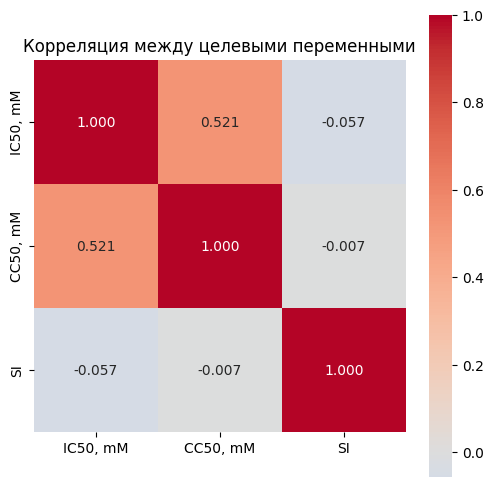

In [ ]:
target_corr = df[['IC50, mM', 'CC50, mM', 'SI']].corr()

plt.figure(figsize=(6, 6))
sns.heatmap(target_corr, annot=True, cmap='coolwarm', center=0,square=True, fmt='.3f')
plt.title('Корреляция между целевыми переменными')
plt.savefig('target_correlation.png', dpi=300, bbox_inches='tight')
plt.show()

Между IC50 и CC50 умеренная корреляция (0.52)

SI имеет слабые корреляции с IC50 (-0.057) и CC50 (-0.007), что говорит о том что SI может не иметь однозначного соответствия с IC50 и CC50

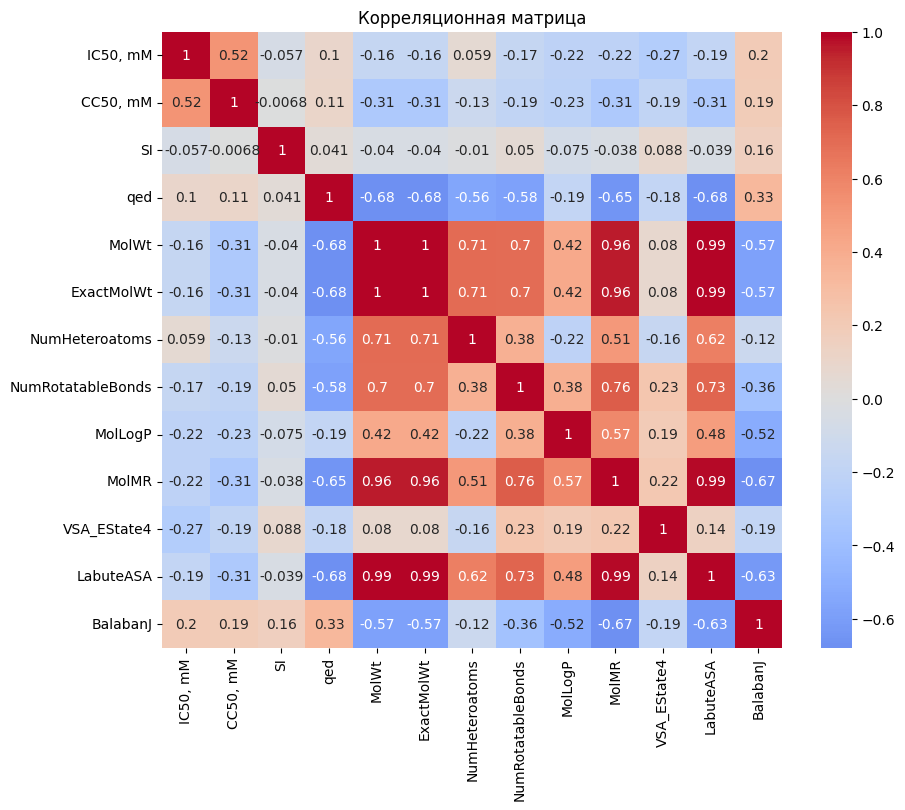

In [ ]:
# Посмотрим матрицу с целевыми переменными и некоторыми признаками
corr_matrix = df[['IC50, mM', 'CC50, mM', 'SI', 'qed', 'MolWt', 'ExactMolWt', 'NumHeteroatoms', 'NumRotatableBonds', 'MolLogP', 'MolMR', 'VSA_EState4', 'LabuteASA', 'BalabanJ']].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Корреляционная матрица')
plt.savefig('correlation.png', dpi=300, bbox_inches='tight')
plt.show()

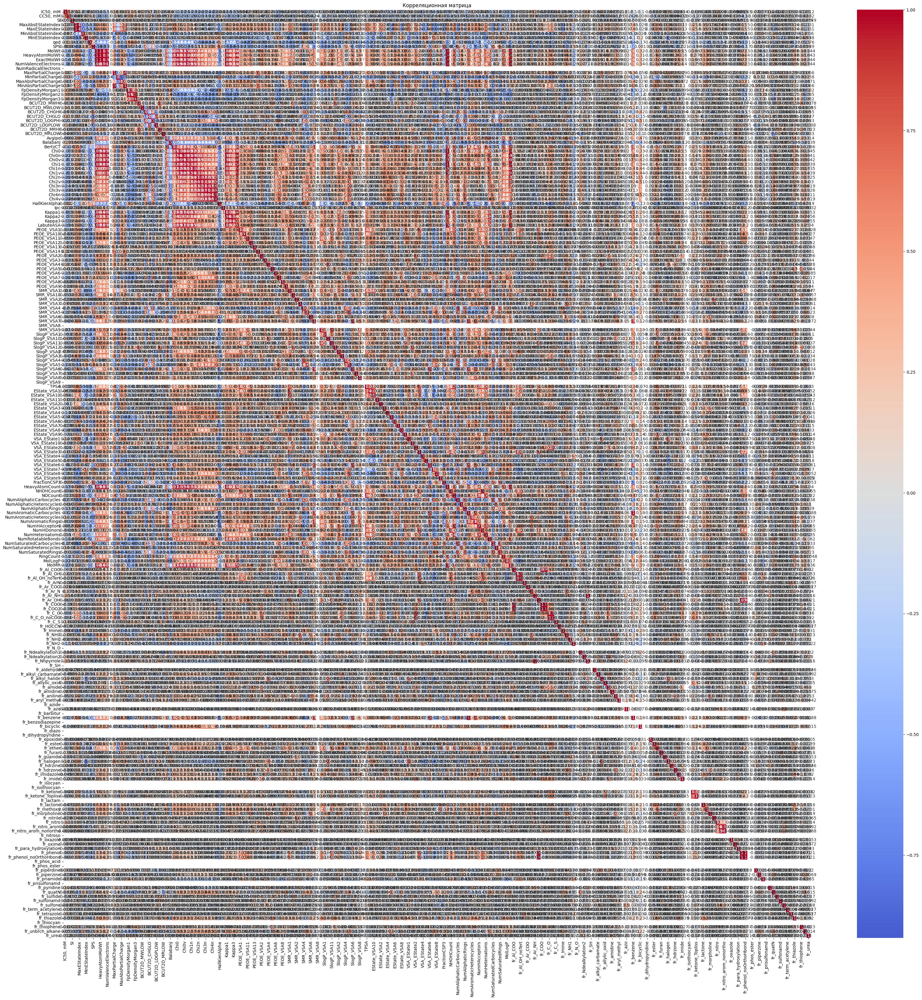

In [ ]:
corr_matrix = df.corr()

plt.figure(figsize=(40, 40))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Корреляционная матрица')
plt.savefig('correlation.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
# посмотрим есть ли констатные признаки
const_features = []
for col in feature_cols:
    if df[col].std() == 0:
        const_features.append(col)

print(f"Константные признаки (с нулевой вариативностью): {len(const_features)}")
print(const_features)

Константные признаки (с нулевой вариативностью): 18
['NumRadicalElectrons', 'SMR_VSA8', 'SlogP_VSA9', 'fr_N_O', 'fr_SH', 'fr_azide', 'fr_barbitur', 'fr_benzodiazepine', 'fr_diazo', 'fr_dihydropyridine', 'fr_isocyan', 'fr_isothiocyan', 'fr_lactam', 'fr_nitroso', 'fr_phos_acid', 'fr_phos_ester', 'fr_prisulfonamd', 'fr_thiocyan']


Выбросы

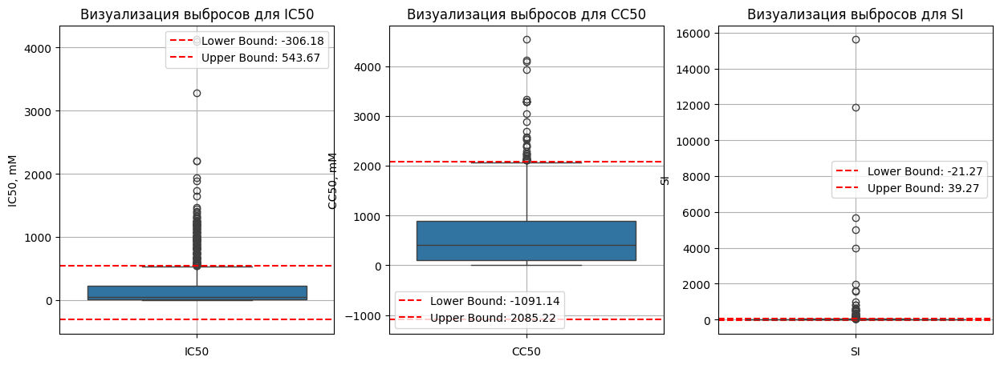

In [ ]:
def get_bounds(df, column):
    q1 = df[column].quantile(0.25)
    q3 = df[column].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    return lower_bound, upper_bound

plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
sns.boxplot(y=df['IC50, mM'])
lower_bound, upper_bound = get_bounds(df, 'IC50, mM')
plt.axhline(lower_bound, color='red', linestyle='--', label=f'Lower Bound: {lower_bound:.2f}')
plt.axhline(upper_bound, color='red', linestyle='--', label=f'Upper Bound: {upper_bound:.2f}')
plt.title(f'Визуализация выбросов для IC50')
plt.xlabel('IC50')
plt.legend()
plt.grid(True)

plt.subplot(1, 3, 2)
sns.boxplot(y=df['CC50, mM'])
lower_bound, upper_bound = get_bounds(df, 'CC50, mM')
plt.axhline(lower_bound, color='red', linestyle='--', label=f'Lower Bound: {lower_bound:.2f}')
plt.axhline(upper_bound, color='red', linestyle='--', label=f'Upper Bound: {upper_bound:.2f}')
plt.title(f'Визуализация выбросов для CC50')
plt.xlabel('CC50')
plt.legend()
plt.grid(True)

plt.subplot(1, 3, 3)
sns.boxplot(y=df['SI'])
lower_bound, upper_bound = get_bounds(df, 'SI')
plt.axhline(lower_bound, color='red', linestyle='--', label=f'Lower Bound: {lower_bound:.2f}')
plt.axhline(upper_bound, color='red', linestyle='--', label=f'Upper Bound: {upper_bound:.2f}')
plt.title(f'Визуализация выбросов для SI')
plt.xlabel('SI')
plt.grid(True)
plt.legend()
plt.show()

Используем метод межквартильного размаха для определения выбросов

In [ ]:
def get_iqr_outliers(df, column):
    q1 = df[column].quantile(0.25)
    q3 = df[column].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    return outliers

def get_zscore_outliers(df, column):
    eps = 1e-10
    log_vals = np.log10(df[column] + eps)
    z_scores = np.abs(stats.zscore(log_vals))
    outliers = df[z_scores > 3]
    return outliers

# для IC50
outliers_ic50 = get_iqr_outliers(df, 'IC50, mM')
outliers_ic50_z = get_zscore_outliers(df, 'IC50, mM')
print(f"Количество выбросов по IQR: {len(outliers_ic50)}")
print(f"Количество выбросов для log(IC50) по Z-score: {len(outliers_ic50_z)}\n")

# для CC50
outliers_cc50 = get_iqr_outliers(df, 'CC50, mM')
outliers_cc50_z = get_zscore_outliers(df, 'CC50, mM')
print(f"Количество выбросов по IQR: {len(outliers_cc50)}")
print(f"Количество выбросов для log(CC50) по Z-score: {len(outliers_cc50_z)}\n")

# для SI
outliers_si = get_iqr_outliers(df, 'SI')
outliers_si_z = get_zscore_outliers(df, 'SI')
print(f"Количество выбросов по IQR: {len(outliers_si)}")
print(f"Количество выбросов для log(SI) по Z-score: {len(outliers_si_z)}\n")

Количество выбросов по IQR: 147
Количество выбросов для log(IC50) по Z-score: 13

Количество выбросов по IQR: 39
Количество выбросов для log(CC50) по Z-score: 16

Количество выбросов по IQR: 125
Количество выбросов для log(SI) по Z-score: 10



На логарифмированных данных получаем маленький процент выбросов по сравнению с результатами по методу межквартильного размаха

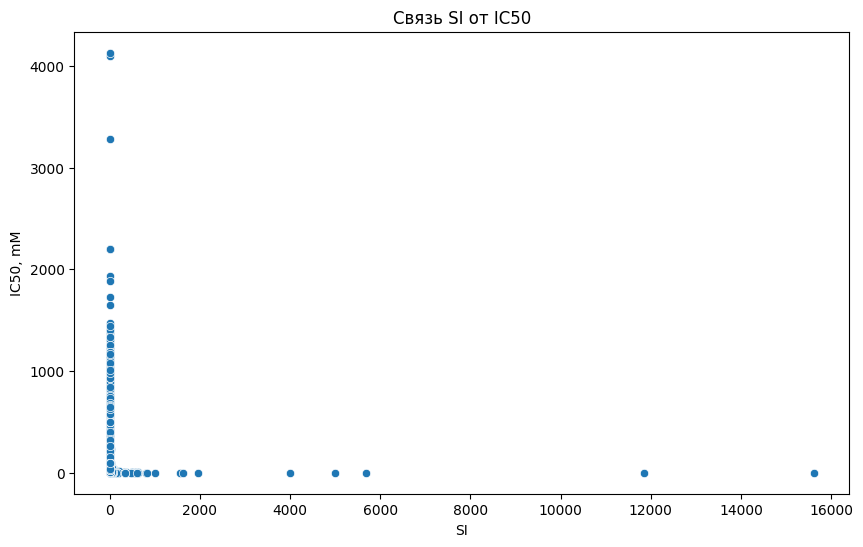

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df['SI'], y=df['IC50, mM'])
plt.title('Связь SI от IC50')
plt.show()

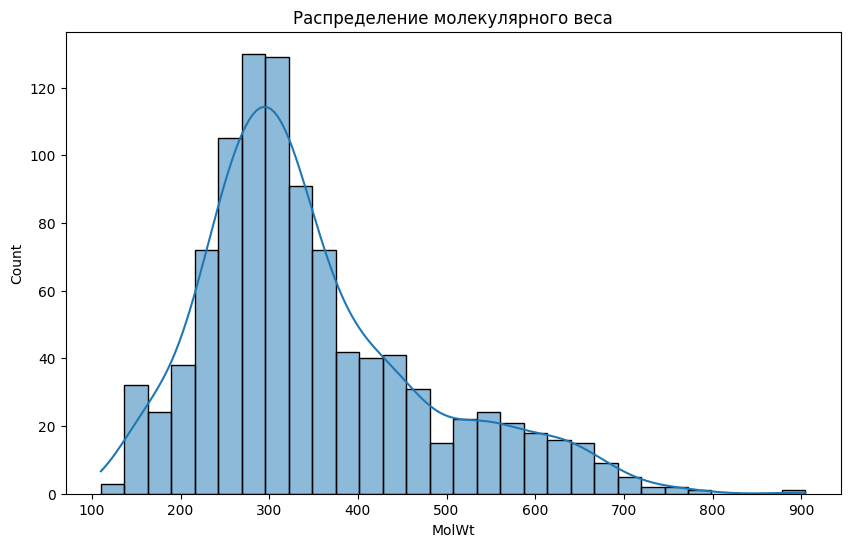

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(df['MolWt'], kde=True, bins=30)
plt.title('Распределение молекулярного веса')
plt.show()

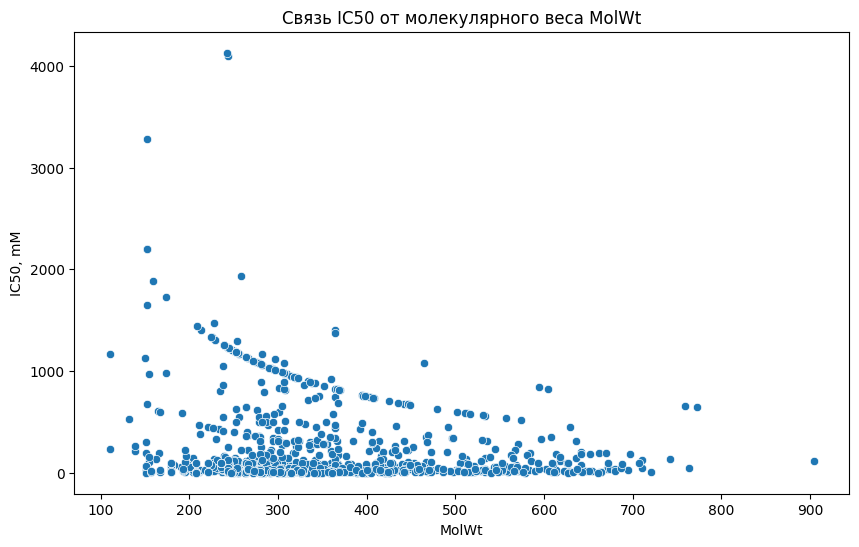

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df['MolWt'], y=df['IC50, mM'])
plt.title('Связь IC50 от молекулярного веса MolWt')
plt.show()

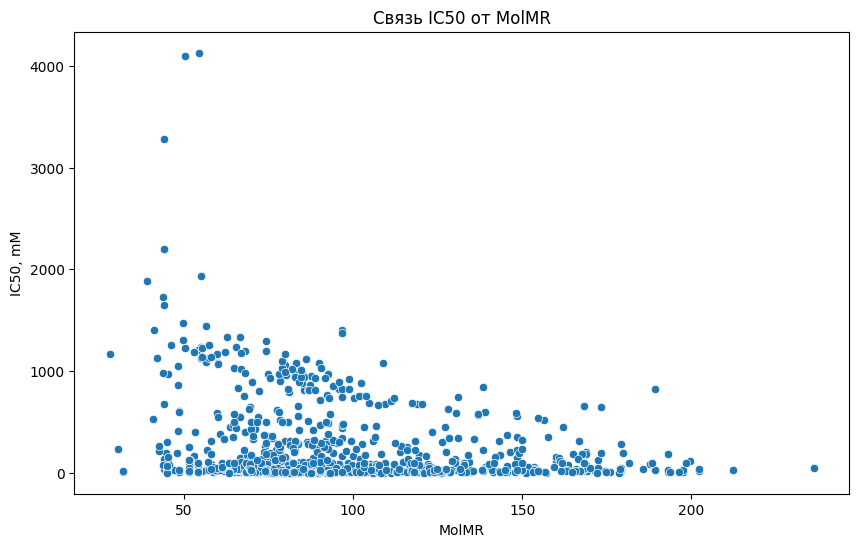

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df['MolMR'], y=df['IC50, mM'])
plt.title('Связь IC50 от MolMR')
plt.show()

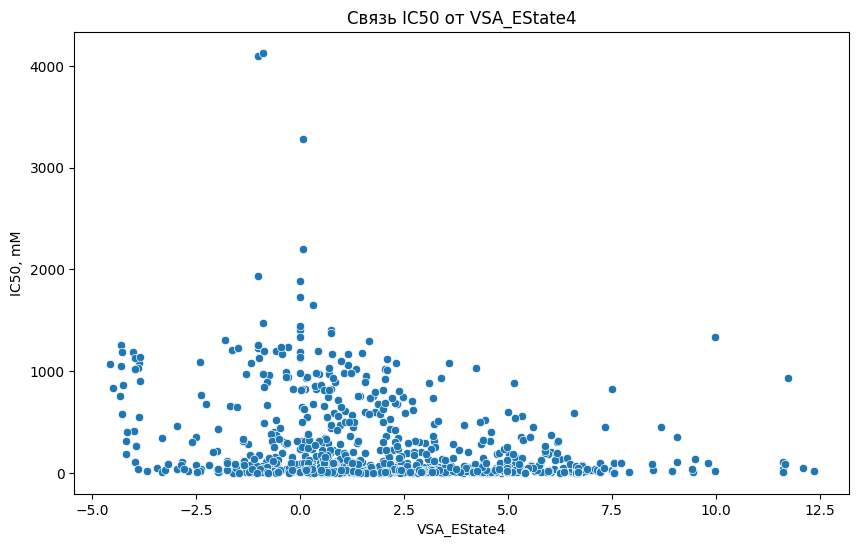

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df['VSA_EState4'], y=df['IC50, mM'])
plt.title('Связь IC50 от VSA_EState4')
plt.show()

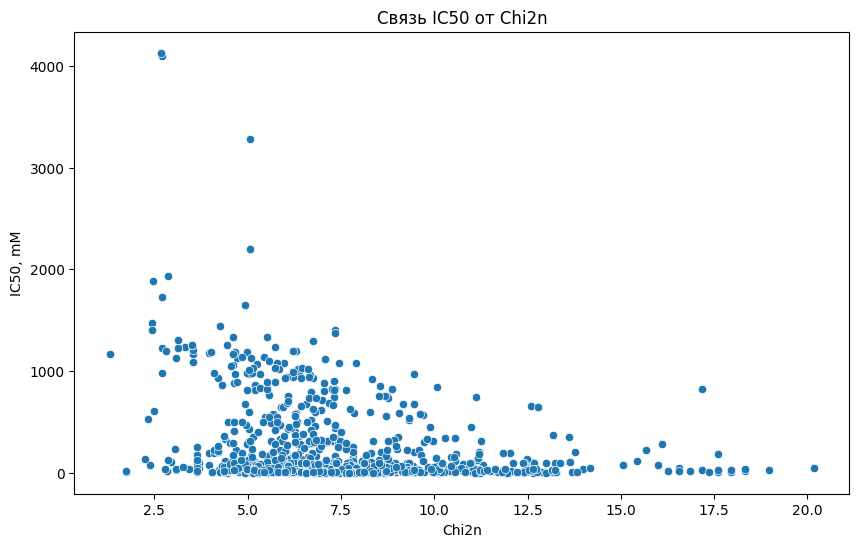

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df['Chi2n'], y=df['IC50, mM'])
plt.title('Связь IC50 от Chi2n')
plt.show()

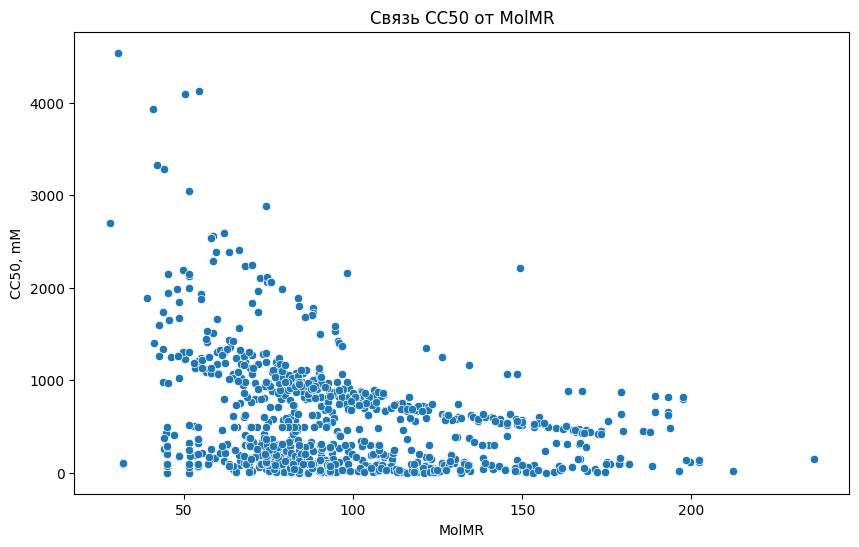

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df['MolMR'], y=df['CC50, mM'])
plt.title('Связь CC50 от MolMR')
plt.show()

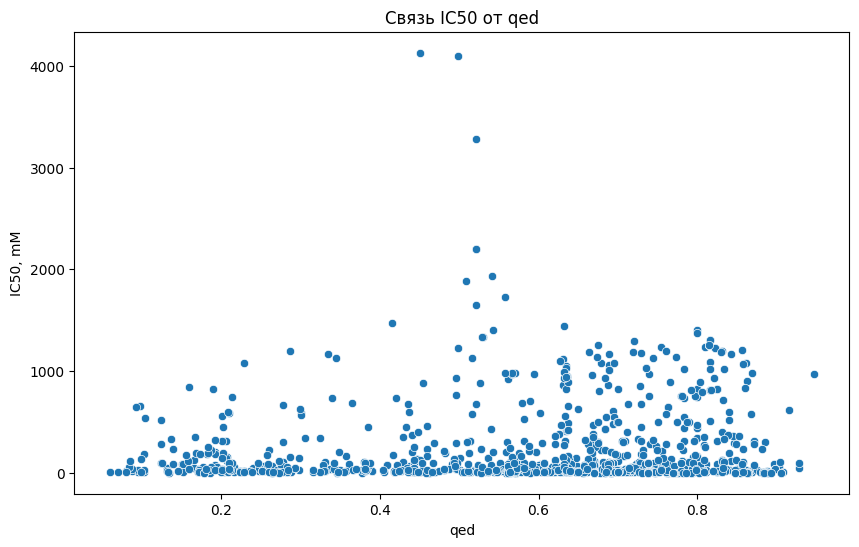

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df['qed'], y=df['IC50, mM'])
plt.title('Связь IC50 от qed')
plt.show()

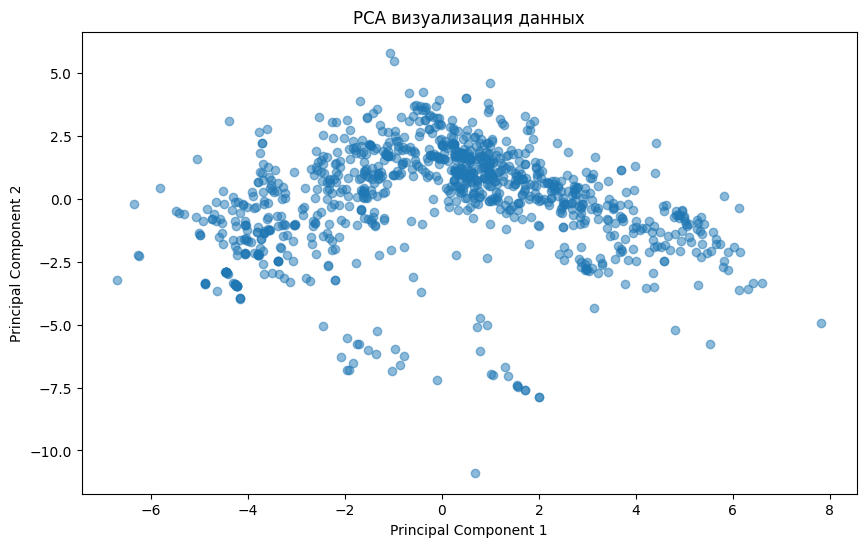

Объясненная дисперсия компонент: [0.36664988 0.2247101 ]


In [ ]:
numeric_cols = [col for col in numeric_cols if df[col].nunique() > 10][:20]  # ограничим количество для примера

scaler = StandardScaler()
scaled_data = scaler.fit_transform(df[numeric_cols].fillna(0))

# Применение PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(scaled_data)

# Визуализация PCA
plt.figure(figsize=(10, 6))
plt.scatter(principal_components[:, 0], principal_components[:, 1], alpha=0.5)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA визуализация данных')
plt.show()

print("Объясненная дисперсия компонент:", pca.explained_variance_ratio_)